In [1]:
#학번: 20175105
#이름: 곽영주

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Artificial Data

- Data is a linear relationship between $x$ and $y$
- Number of samples is `total_samples`

- The collection of data is a $x\in \mathbb{R}^\text{total_samples}$ column vector
- The collection of labels is a $y\in \mathbb{R}^\text{total_samples}$ column vector

- 전체 sample들을 training set 과 test set으로 나눠서 저장함
- training set 과 test set은 모두 `numpy array` 자료 구조로 구성함


In [9]:
np.random.seed(5)
total_samples = 100
num_train_samples = 60
num_test_samples = 40

x = np.vstack([(300-50)*np.random.rand(total_samples-10,1)+50, (450-250)*np.random.rand(10,1)+250])

perm = np.random.permutation(total_samples)
x = x[perm]

y = 2.0*x + 10 + np.sqrt(5000)*np.random.randn(total_samples,1)

X_train = x[0:num_train_samples]
X_test = x[num_train_samples+1:]
Y_train = y[0:num_train_samples]
Y_test = y[num_train_samples+1:]

Text(0, 0.5, 'Price')

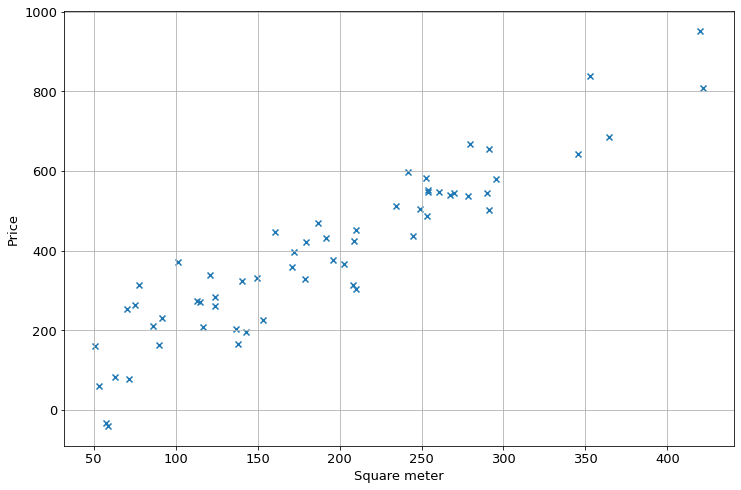

In [10]:
plt.rcParams['font.size'] = 13
plt.rcParams["figure.figsize"] = (12,8)
plt.scatter(X_train, Y_train, marker = 'x')
#plt.scatter(X_test, Y_test, marker = 'o', color = 'red')
plt.grid()
plt.xlabel('Square meter')
plt.ylabel('Price')


# 표기 정리

위에서 각 정의된 변수들을 살펴서 수업 표기법과 비교해드립니다. 
`numpy array` `X_train`에 있는 각 원소들은 $x^{(i)}$들을 모아둔 array 입니다. 
예를 들어서 

- $x^{(1)}$ = `X_train[0]`, $x^{(2)}$ = `X_train[1]`
- $y^{(1)}$ = `Y_train[0]`, $y^{(2)}$ = `Y_train[1]`

즉
\begin{align*}
\text{X_train} = \begin{bmatrix}
\text{X_train[0]} \\
\text{X_train[1]}\\
\vdots\\
\text{X_train[m-1]}
\end{bmatrix} = \begin{bmatrix}
(x^{(1)})^T\\
(x^{(2)})^T\\
\vdots\\
(x^{(m)})^T
\end{bmatrix}
\end{align*}

In [11]:
def model(x, theta):
    return theta * x

예를 들어서 $\theta = 3.0$일때, $h_\theta(x^{(1)})$은

# 2. Define Model

As in class, we first choose our model as
\begin{align*}
h(x) = \theta x 
\end{align*}

- `model(x, theta)`를 완성하세요

In [12]:
model(X_train[0], 3.0)

array([1259.98801943])

## Problem 1
- `model(X_train, 3.0)`을 수행하면 어떤 결과가 나오나요?
- `Xtrain`의 함수로 $a$, $b$, $c$, $d$  자리에 들어갈 값을 표기하세요 (숫자를 넣는 것이 아닙니다)
  - $x^{(i)}$들과 $\theta$로 표현 하세요
- 아래 markdown cell을 더블클릭 하시면 수정 가능합니다.
- Latex이 익숙하지 않더라도, 아래 $a$, $b$, $c$, $d$ 자리에 다른 문자를 넣고 셀을 실행해보세요, 그럼 사용법이 익혀질 것입니다

답 작성)

\begin{align*}
\texttt{model(Xtrain, 3.0)} = 
\begin{bmatrix}
\theta x^{(1)} \\
\theta x^{(2)}  \\
\theta x^{(3)} \\
\vdots\\
\theta x^{(m)}
\end{bmatrix}
\end{align*}

- `model` 함수가 잘 작성되었는지 확인합시다
- For some random choice $\theta = 3.0$ we have the estimates as follows

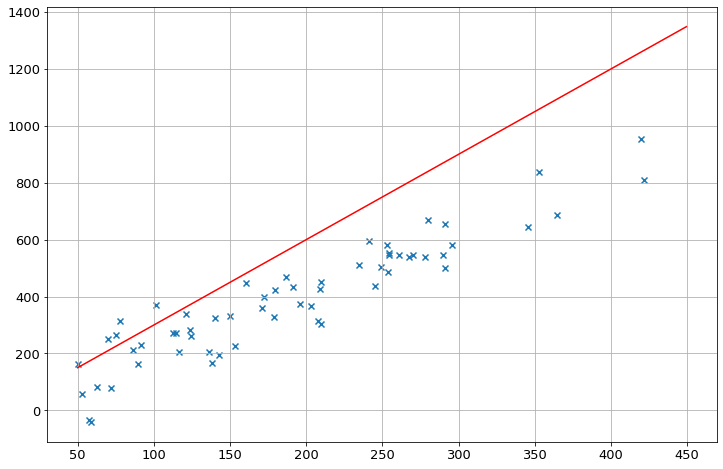

In [13]:
x_arange = np.arange(50, 450, 0.5)
hx_test_theta_3 = model(x_arange, 3.0)
plt.plot(x_arange, hx_test_theta_3, color = 'red')
plt.scatter(X_train, Y_train, marker = 'x')
plt.grid()

# 3. Define Cost Function

## Problem 2
`mmse_cost(hx, y)`를 다음과 같이 완성하세요
- $m$을 training data size라고 가정
- input hx는 training sample $x\in\mathbb{R}^m$ 에 대한 $h_\theta(x)\in\mathbb{R}^m$ 값
- input y는 label $y\in\mathbb{R}^m$
- output
\begin{align*}
\text{output} = \frac{1}{m}\sum_{i=1}^m (h_\theta(x^{(i)})- y^{(i)})^2
\end{align*}

In [14]:
# 답 작성

def mmse_cost(hx, y):
    return np.mean((hx-y)**2, axis=0)

역시 잘 작성되었는지 확인해보도록 합시다.
우선 재미로 $\theta = 3.0$ 인 모델과 $\theta = 2.0$ 모델의 크기를 비교해보죠

In [16]:
hx_theta2 = model(X_train, 2.0)
hx_theta3 = model(X_train, 3.0)
print('theta = 2.0 model loss = ', mmse_cost(hx_theta2, Y_train))
print('theta = 3.0 model loss = ', mmse_cost(hx_theta3, Y_train))

theta = 2.0 model loss =  [5708.74781518]
theta = 3.0 model loss =  [45328.60240828]


## Problem 3
- 위 두가지 모델중에서 어느 모델이 더 좋은 모델인가요? 이유는?
- 아래 markdown cell을 더블 클릭해서 작성하세요

답 작성) theta=2.0 medel이 더 좋은 모델입니다. 이유는 theta=3.0 model보다 loss 값이 작기 때문입니다.

# 직접 최적 방법 찾기

- 이론 수업 영상을 통해서 `mmse`의 최적 $\theta$ 해는 
\begin{align*}
\frac{dJ(\theta)}{d\theta} = 0
\end{align*}
의 해를 구하면 된다고 했습니다.
- 그 해는 
\begin{align*}
\theta^\star  = \frac{ \sum_{i=1}^m y^{(i)}x^{(i)}}{\sum_{i=1}^m (x^{(i)})^2} 
\end{align*}
와 같이 구해진다고 했죠? 

## Problem 4
아래 $\theta^\star$를 구하는 함수를 만드세요
- 함수명 및 형태: `theta_star(x, y)`
- input x는 `X_train`을 넣는 자리고
- input y는 `Y_train`을 넣는 자리입니다

In [19]:
def theta_star(x, y):
    numerator = np.matmul(Y_train.reshape(1,60), X_train)[0,0]
    denominator = np.sum(X_train**2)
    return numerator/denominator

잘 찾았는지 확인하죠

In [21]:
ts = theta_star(X_train, Y_train)
print(ts)

2.057882338154969


In [22]:
print('optimal cost = ', mmse_cost(model(X_train, ts), Y_train))
print('Random cost = ', mmse_cost(model(X_train, 3.0), Y_train))

optimal cost =  [5558.62830133]
Random cost =  [45328.60240828]


최적 model이 어떤 형태인지 보도록 하죠

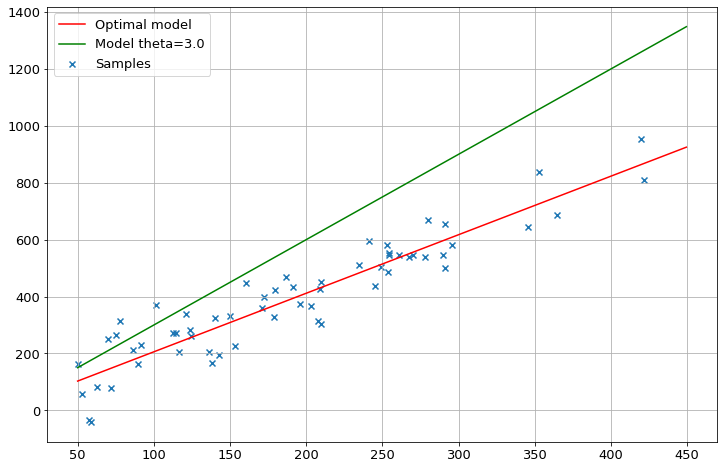

In [23]:
plt.scatter(X_train, Y_train, marker = 'x')
plt.plot(x_arange, model(x_arange, ts), color = 'red')
plt.plot(x_arange, model(x_arange, 3.0), color = 'green')
plt.legend(['Optimal model', 'Model theta=3.0', 'Samples'])
plt.grid()

# Finding the optimal model via Gradient Descent Algorithm
- 다음 학습은 gradient descent (GD) algorithm을 통해서 최적 모델을 찾도록 하죠
- 우선 loss 함수가 어떻게 생겼는지 한번 보도록 하겠습니다.

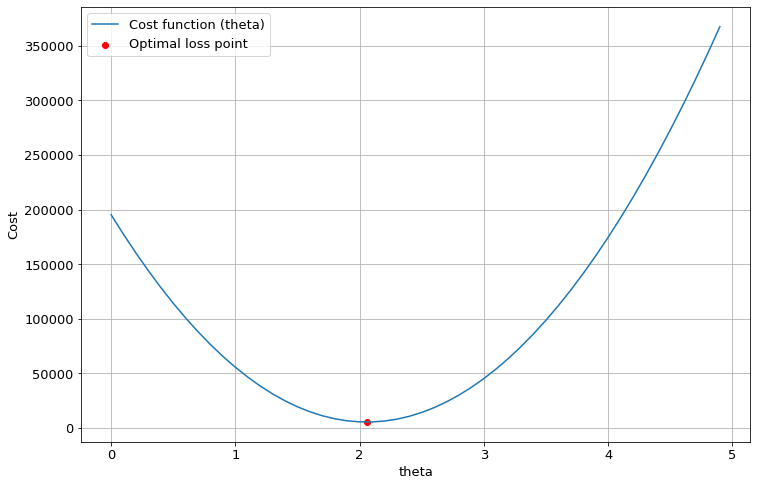

In [24]:
theta_range = np.arange(0, 5, 0.1)
loss_range = mmse_cost(model(X_train, theta_range), Y_train)
plt.plot(theta_range, loss_range)
plt.scatter(ts, mmse_cost(model(X_train, ts), Y_train), color = 'red')
plt.xlabel('theta')
plt.ylabel('Cost')
plt.legend(['Cost function (theta)', 'Optimal loss point'])
plt.grid()

역시 $\theta$에 대한 2차 함수임을 알수 있죠?
최적 point
\begin{align*}
\theta^\star &= 2.0578823381549687\\
J(\theta^\star) &=5558.62830133
\end{align*}
임을 볼 수 있습니다.
이제 같은 결과를 GD로 찾아보도록 하죠. 
GD는 다음 한줄이죠?
\begin{align*}
\theta \leftarrow \theta - \alpha \frac{d J(\theta)}{d \theta}.
\end{align*}

우선 미분 함수를 정의하죠.

## Problem 5
MMSE 함수에 대한 미분함수 `mmse_gradient(theta, x, y)`를 구하세요.
- MMSE 미분함수는 수업에서 
\begin{align*}
\frac{d J(\theta)}{d\theta} &= \frac{1}{m}\sum_{i=1}^m  2\left( \theta x^{(i)}- y^{(i)}\right)x^{(i)}
\end{align*}
임을 확인했죠?

- input `theta`는 `theta`에서의 미분값을 구하겠다는 변수이고요 $\frac{J(\theta)}{d\theta}|_{\theta = \texttt{theta}}$

In [27]:
# 답 작성

def mmse_gradient(theta, x, y):
    return np.mean(2.0 * (theta * x - y) * x, axis=0)

잘 되었는지 확인을 위해서 다음을 구해보죠.
우리는 $\theta = 2.0578823381549687$에서 기울기가 `0` 인 것을 아니까, 이를 이용해서 확인하죠

In [28]:
mmse_gradient(ts, X_train, Y_train)

array([-1.13990003e-11])

## Problem 6: Implementing GD
이제 GD algorithm을 구현해보죠.
아래 `gradient_descent(x, y, t_init, lr, num_epoch)`를 구하도록 하죠.

- input `x`는 `X_train`이 들어갈 자리
- input `y`는 `Y_train`이 들어갈 자리
- input `t_init`은 $\theta$ 초기값 
- input `lr`는 learning rate
- input `num_epoch`은 총 반복 횟수입니다



In [29]:
def gradient_descent(x, y, t_init, lr, num_epoch):
    theta = t_init
    for i in np.arange(num_epoch):
        # 답 작성
        theta = theta - lr * mmse_gradient(theta, x, y)
    return theta
        

잘되었는지 확인해보죠
- `t_init`은 일반적으로 랜덤하게 하는것이 좋지만, 우리 숙제 목적상 `t_init`은 $10$으로 하겠습니다
- `lr=0.00001`
- `num_epoch = 10`
으로 돌려보죠


In [44]:
num_epoch = 10
lr = 0.00001
t_init = 10

ts_gd = gradient_descent(X_train, Y_train, t_init, lr, num_epoch)
print('gradient descent theta star = ', ts_gd)
print('Directly solved theta star = ', ts)

gradient descent theta star =  [2.05788234]
Directly solved theta star =  2.057882338154969


## Bonus Problem
Gradient descent가 어떤식으로 이루어 지는지 각 `epoch` 별로 값을 저장해보도록 함수를 다시 만들어보죠

- gradient_descent_v2(x, y, t_init, lr, num_epoch)를 비슷한 함수로 만들지만, 
- 출력 값을 각 epoch 별로 업데이트한 theta를 저장하세요
- 즉 theta[3]은 4번째 epoch에서 업데이트 된 theta를 저장하도록 np.array로 구성하세요
- 추가로 각 epoch 별 해당 `theta[i]`를 사용한 loss 함수를 구하세요



In [46]:
def gradient_descent_v2(x, y, t_init, lr, num_epoch):
    theta = np.zeros(num_epoch)
    loss = np.zeros(num_epoch)
    theta[0] = t_init
    loss[0] = mmse_cost(model(X_train, theta[0]), Y_train)
    for i in np.arange(1, num_epoch):
        # 답 작성
        theta[i] = theta[i-1] - lr * mmse_gradient(theta[i-1], x, y)
        loss[i] = mmse_cost(model(X_train, theta[i]), Y_train)
    return theta, loss

확인 하시죠
- `t_init`은 일반적으로 랜덤하게 하는것이 좋지만, 우리 숙제 목적상 `theta[0]`은 $10$으로 하겠습니다
- `lr=0.00001`
- `num_epoch = 10`
으로 돌려보죠

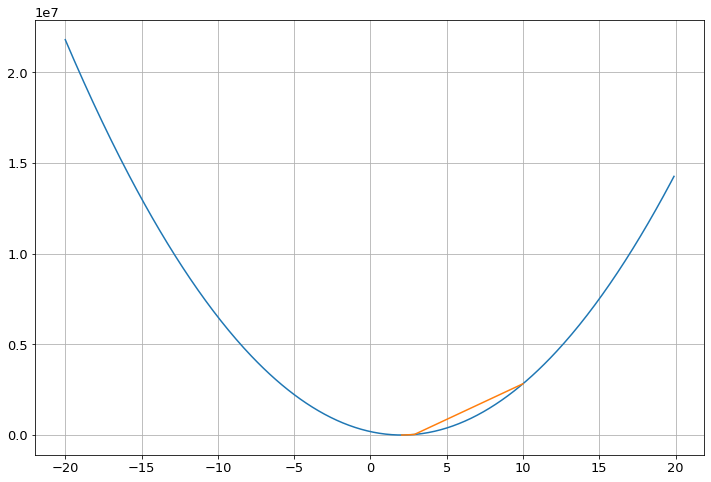

In [54]:
lr = 0.00001
num_epoch = 10
t_init = 10

theta_gd_array, loss_gd_array = gradient_descent_v2(X_train, Y_train, t_init, lr, num_epoch)

theta_range = np.arange(-20, 20, 0.1)
loss_range = mmse_cost(model(X_train, theta_range), Y_train)

plt.plot(theta_range, loss_range)
plt.plot(theta_gd_array, loss_gd_array)
plt.grid()

# Epoch vs. Loss curve

기계학습에서 중요한 plot 중 하나는 학습 진척도를 epoch 별로 보여주는 epoch vs. Loss curve 입니다.
아래 그리는 방법은 필히 알아두시기 바랍니다.


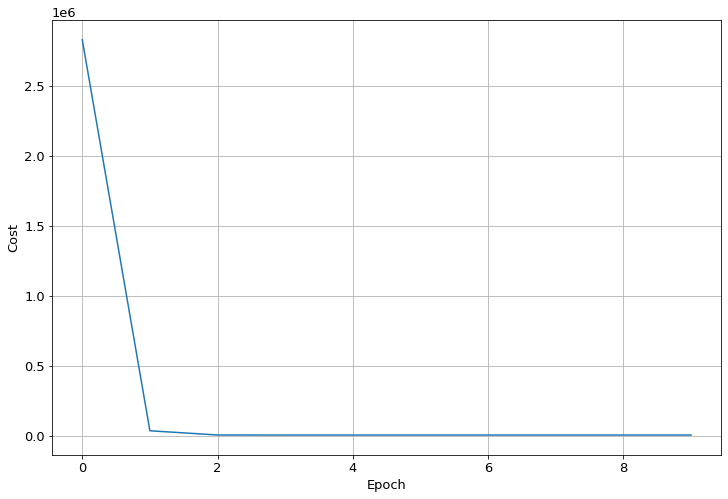

In [21]:

plt.plot(np.arange(0,num_epoch), loss_gd_array)
#plt.semilogy(np.arange(0,num_epoch), loss_gd_array)
plt.xlabel('Epoch')
plt.ylabel('Cost')
plt.grid()

Animation으로 진행하는 것을 learning rate을 변화하면서 보도록 하죠

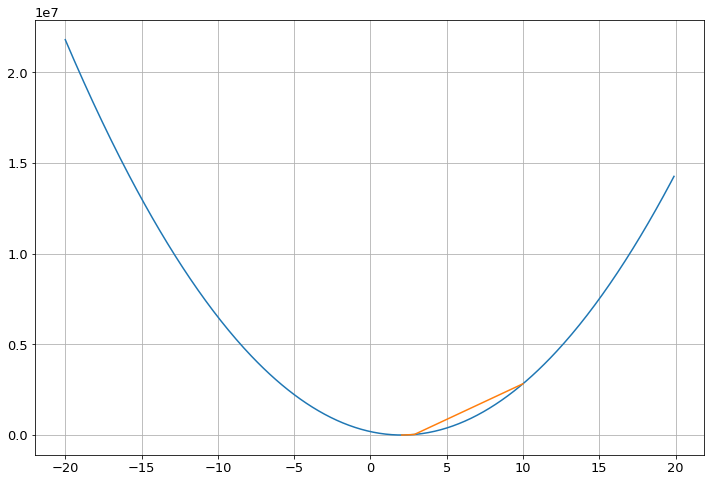

In [56]:
import matplotlib.animation


t_init = 10
num_epoch = 10

lr = 0.00001
#lr = 0.00002
#lr = 0.000001
#lr = 0.000024


fig, ax = plt.subplots()
#ax.axis([0,2*np.pi,-1,1])
theta_range = np.arange(-20, 20, 0.1)
loss_range = mmse_cost(model(X_train, theta_range), Y_train)

ax.plot(theta_range, loss_range)
line, = ax.plot([], [])
theta_gd_array, loss_gd_array = gradient_descent_v2(X_train, Y_train, t_init, lr, num_epoch)
plt.grid()


def animate(i):
    line.set_data(theta_gd_array[:i], loss_gd_array[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(theta_range), interval=400)

from IPython.display import HTML
HTML(ani.to_jshtml())